<a href="https://colab.research.google.com/github/Karishmaaa22/ML-safety/blob/main/ML%20safety%20notebook%201.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Exercise 3

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train_path = "/content/drive/MyDrive/Data2/train"
test_path = "/content/drive/MyDrive/Data2/test"
validation_path="/content/drive/MyDrive/Data2/validation"

In [ ]:
import pandas as pd
labels_train = pd.read_csv(train_path + "/labels.csv")
labels_test = pd.read_csv(test_path + "/labels.csv")
labels_validation=pd.read_csv(validation_path+"/labels.csv")

In [ ]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))

True
Tesla T4


In [ ]:
print(labels_train.head())

   frame  has_traffic_light  has_pedestrian  has_vehicle  px_traffic_light  \
0      0              False           False         True                 0   
1     10              False            True         True                14   
2     20               True            True         True                99   
3     30               True            True         True                99   
4     40               True            True         True               101   

   px_pedestrian  px_vehicle  
0              0          85  
1            301        1138  
2            196         517  
3            181         530  
4            169         538  


Exercise 3.4

In [ ]:
import os
train_images = os.listdir(train_path+"/rgb-front")
test_images = os.listdir(test_path+"/rgb-front")
print("Number of Training Images:", len(train_images))
print("Number of Test Images:", len(test_images))

Number of Training Images: 7200
Number of Test Images: 3600


In [ ]:
labels=["has_pedestrian","has_traffic_light","has_vehicle"]
for label in labels:
  print(f"Class Distribution: {label}")
  distribution =(labels_train[label].value_counts())
  print(distribution)

Class Distribution: has_pedestrian
has_pedestrian
False    5482
True     1718
Name: count, dtype: int64
Class Distribution: has_traffic_light
has_traffic_light
True     5276
False    1924
Name: count, dtype: int64
Class Distribution: has_vehicle
has_vehicle
True     5458
False    1742
Name: count, dtype: int64


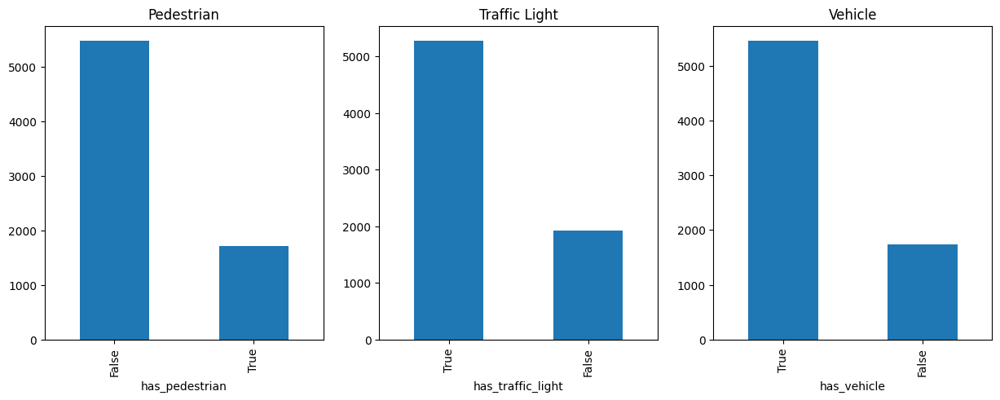

In [ ]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 3, figsize=(15,5))
labels_train['has_pedestrian'].value_counts().plot(
    kind='bar',
    ax=axes[0],
    title='Pedestrian'
)
labels_train['has_traffic_light'].value_counts().plot(
    kind='bar',
    ax=axes[1],
    title='Traffic Light'
)
labels_train['has_vehicle'].value_counts().plot(
    kind='bar',
    ax=axes[2],
    title='Vehicle'
)
plt.show()

In [ ]:
print(labels_train.columns)

Index(['frame', 'has_traffic_light', 'has_pedestrian', 'has_vehicle',
       'px_traffic_light', 'px_pedestrian', 'px_vehicle'],
      dtype='object')


In [ ]:
print(labels_train.iloc[0])

frame                    0
has_traffic_light    False
has_pedestrian       False
has_vehicle           True
px_traffic_light         0
px_pedestrian            0
px_vehicle              85
Name: 0, dtype: object


In [ ]:
train_rgb_path=train_path+"/rgb-front"
test_rgb_path=test_path+"/rgb-front"
validation_rgb_path=validation_path+"/rgb-front"

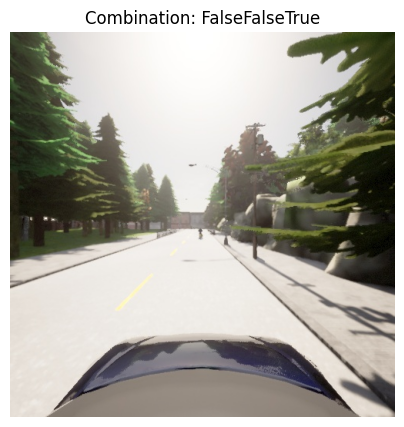

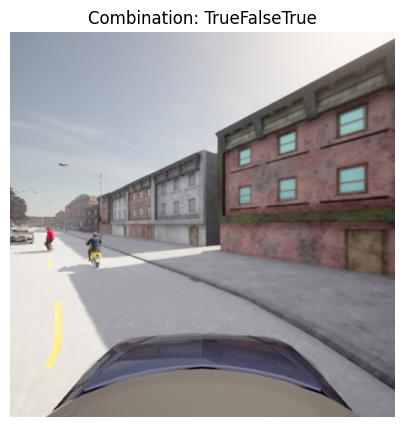

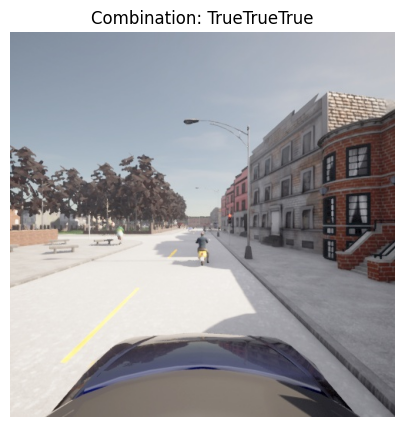

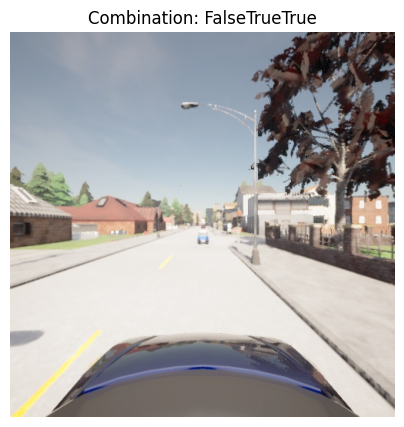

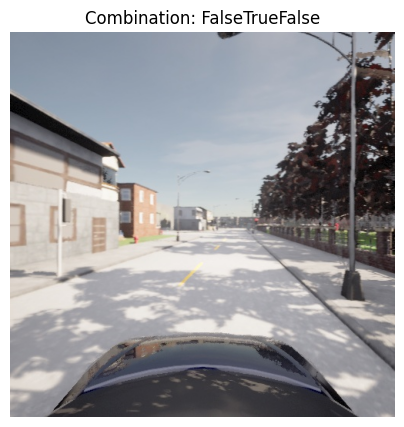

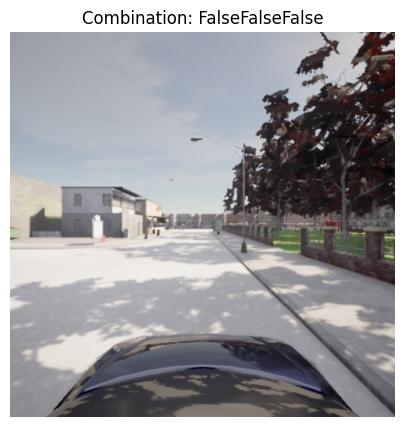

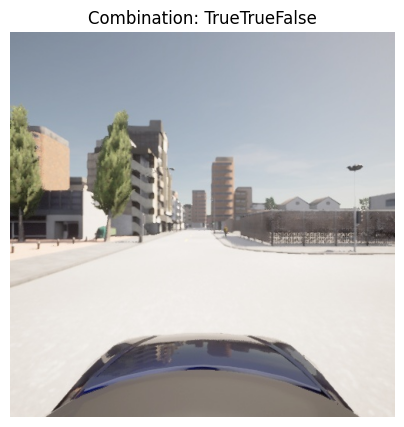

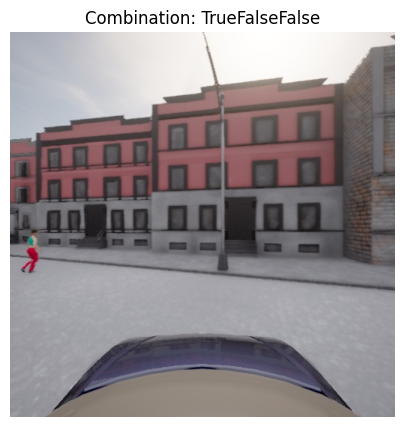

In [ ]:
from PIL import Image
labels_train['combination'] = (
    labels_train['has_pedestrian'].astype(str)
    + labels_train['has_traffic_light'].astype(str)
    + labels_train['has_vehicle'].astype(str)
)
unique_combinations = labels_train['combination'].unique()
for combo in unique_combinations:
    sample = labels_train[
        labels_train['combination'] == combo
    ].iloc[0]
    image_name = f"{sample['frame']:06d}.jpg"
    image_path = os.path.join(
        train_rgb_path,
        image_name
    )
    image = Image.open(image_path)
    plt.figure(figsize=(5,5))
    plt.imshow(image)
    plt.title(f"Combination: {combo}")
    plt.axis('off')
    plt.show()

Exercise 3.5

In [ ]:
from torchvision import models
import torch.nn as nn
def create_model():
    model = models.resnet18(
        weights=models.ResNet18_Weights.DEFAULT
    )
    model.fc = nn.Linear(512, 1)
    return model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = create_model().to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(
    model.parameters(),
    lr=1e-4,
    weight_decay=1e-4
)
batch_size = 32
epochs = 10

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:01<00:00, 35.7MB/s]


In [ ]:
from torch.utils.data import Dataset
class CarlaDataset(Dataset):
    def __init__(
        self,
        dataframe,
        image_dir,
        label_column,
        transform=None
    ):
        self.dataframe = dataframe
        self.image_dir = image_dir
        self.label_column = label_column
        self.transform = transform
    def __len__(self):
        return len(self.dataframe)
    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        image_name = f"{row['frame']:06d}.jpg"
        image_path = os.path.join(
            self.image_dir,
            image_name
        )
        image = Image.open(
            image_path
        ).convert("RGB")
        label = torch.tensor(
            row[self.label_column],
            dtype=torch.float32
        )
        if self.transform:
            image = self.transform(image)
        return image, label

In [ ]:
import torchvision.transforms as transforms
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [ ]:
import torch
device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)
print("Using Device:", device)

Using Device: cuda


Training Model For: has_pedestrian


100%|██████████| 225/225 [15:32<00:00,  4.15s/it]


Epoch [1/10] | Train Loss: 0.4365 | Val Loss: 0.6729


100%|██████████| 225/225 [01:09<00:00,  3.22it/s]


Epoch [2/10] | Train Loss: 0.2936 | Val Loss: 0.7750


100%|██████████| 225/225 [01:05<00:00,  3.42it/s]


Epoch [3/10] | Train Loss: 0.1867 | Val Loss: 0.9435


100%|██████████| 225/225 [01:06<00:00,  3.37it/s]


Epoch [4/10] | Train Loss: 0.1255 | Val Loss: 1.1749


100%|██████████| 225/225 [01:09<00:00,  3.26it/s]


Epoch [5/10] | Train Loss: 0.0935 | Val Loss: 1.2357


100%|██████████| 225/225 [01:06<00:00,  3.37it/s]


Epoch [6/10] | Train Loss: 0.0753 | Val Loss: 1.2363


100%|██████████| 225/225 [01:07<00:00,  3.33it/s]


Epoch [7/10] | Train Loss: 0.0535 | Val Loss: 1.3420


100%|██████████| 225/225 [01:08<00:00,  3.30it/s]


Epoch [8/10] | Train Loss: 0.0453 | Val Loss: 1.4612


100%|██████████| 225/225 [01:07<00:00,  3.33it/s]


Epoch [9/10] | Train Loss: 0.0510 | Val Loss: 1.6356


100%|██████████| 225/225 [01:07<00:00,  3.31it/s]


Epoch [10/10] | Train Loss: 0.0483 | Val Loss: 1.4698


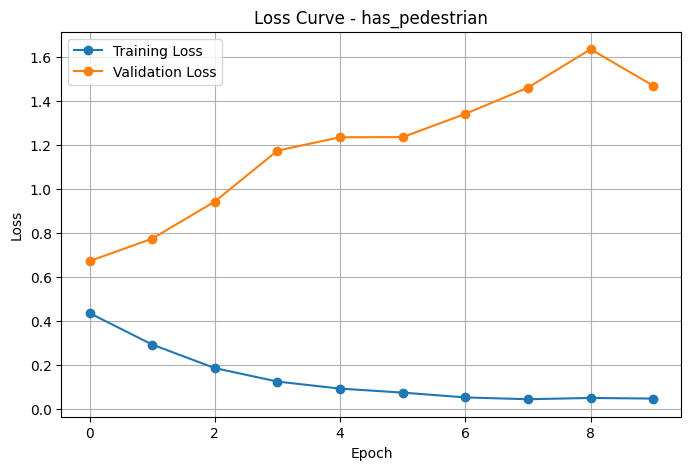

Saved: has_pedestrian_model.pth
Training Model For: has_traffic_light


100%|██████████| 225/225 [01:06<00:00,  3.36it/s]


Epoch [1/10] | Train Loss: 0.1456 | Val Loss: 1.9876


100%|██████████| 225/225 [01:08<00:00,  3.30it/s]


Epoch [2/10] | Train Loss: 0.0417 | Val Loss: 2.4238


100%|██████████| 225/225 [01:06<00:00,  3.37it/s]


Epoch [3/10] | Train Loss: 0.0340 | Val Loss: 2.7996


100%|██████████| 225/225 [01:06<00:00,  3.36it/s]


Epoch [4/10] | Train Loss: 0.0216 | Val Loss: 3.0141


100%|██████████| 225/225 [01:08<00:00,  3.30it/s]


Epoch [5/10] | Train Loss: 0.0179 | Val Loss: 3.3286


100%|██████████| 225/225 [01:04<00:00,  3.47it/s]


Epoch [6/10] | Train Loss: 0.0162 | Val Loss: 3.2865


100%|██████████| 225/225 [01:07<00:00,  3.31it/s]


Epoch [7/10] | Train Loss: 0.0136 | Val Loss: 3.2215


100%|██████████| 225/225 [01:08<00:00,  3.30it/s]


Epoch [8/10] | Train Loss: 0.0102 | Val Loss: 3.6131


100%|██████████| 225/225 [01:05<00:00,  3.45it/s]


Epoch [9/10] | Train Loss: 0.0124 | Val Loss: 3.3374


100%|██████████| 225/225 [01:07<00:00,  3.34it/s]


Epoch [10/10] | Train Loss: 0.0153 | Val Loss: 3.9460


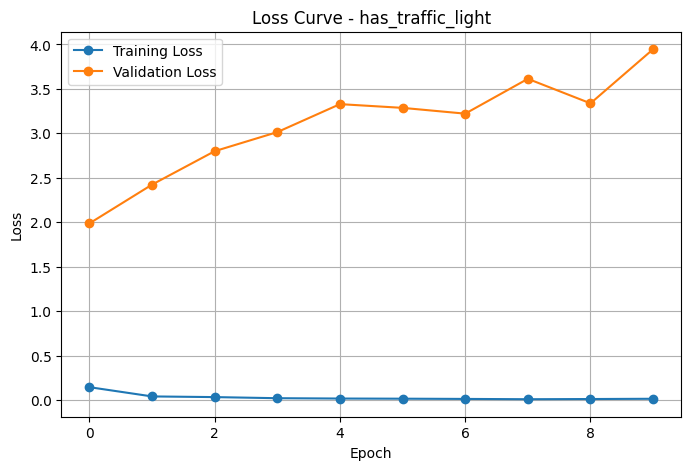

Saved: has_traffic_light_model.pth
Training Model For: has_vehicle


100%|██████████| 225/225 [00:58<00:00,  3.87it/s]


Epoch [1/10] | Train Loss: 0.3111 | Val Loss: 1.4048


100%|██████████| 225/225 [01:00<00:00,  3.75it/s]


Epoch [2/10] | Train Loss: 0.1815 | Val Loss: 1.4878


100%|██████████| 225/225 [01:00<00:00,  3.73it/s]


Epoch [3/10] | Train Loss: 0.1321 | Val Loss: 1.6860


100%|██████████| 225/225 [00:57<00:00,  3.89it/s]


Epoch [4/10] | Train Loss: 0.1079 | Val Loss: 1.6250


100%|██████████| 225/225 [00:58<00:00,  3.82it/s]


Epoch [5/10] | Train Loss: 0.0907 | Val Loss: 1.5930


100%|██████████| 225/225 [00:59<00:00,  3.75it/s]


Epoch [6/10] | Train Loss: 0.0691 | Val Loss: 1.6931


100%|██████████| 225/225 [00:58<00:00,  3.84it/s]


Epoch [7/10] | Train Loss: 0.0590 | Val Loss: 2.1687


100%|██████████| 225/225 [00:59<00:00,  3.77it/s]


Epoch [8/10] | Train Loss: 0.0547 | Val Loss: 2.0707


100%|██████████| 225/225 [01:00<00:00,  3.72it/s]


Epoch [9/10] | Train Loss: 0.0466 | Val Loss: 2.1435


100%|██████████| 225/225 [01:03<00:00,  3.53it/s]


Epoch [10/10] | Train Loss: 0.0416 | Val Loss: 2.4899


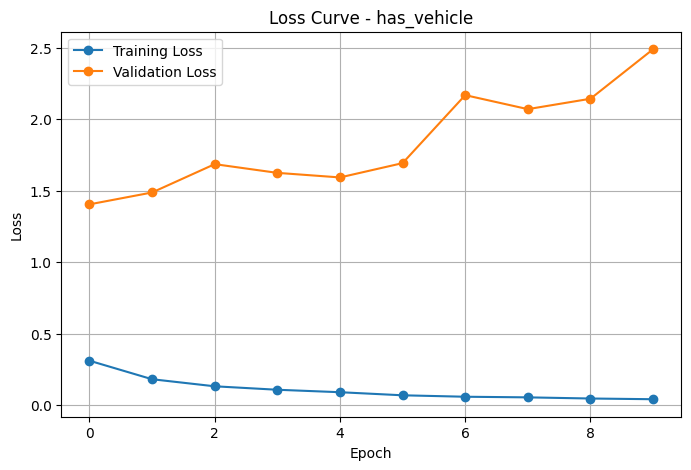

Saved: has_vehicle_model.pth


In [ ]:
from torch.utils.data import DataLoader
from tqdm import tqdm
tasks = [
    "has_pedestrian",
    "has_traffic_light",
    "has_vehicle"
]
for task in tasks:
    print(f"Training Model For: {task}")
    train_dataset = CarlaDataset(
        dataframe=labels_train,
        image_dir=train_rgb_path,
        label_column=task,
        transform=transform
    )
    validation_dataset = CarlaDataset(
        dataframe=labels_test,
        image_dir=validation_rgb_path,
        label_column=task,
        transform=transform
    )
    train_loader = DataLoader(
        train_dataset,
        batch_size=32,
        shuffle=True,
        num_workers=2
    )
    validation_loader = DataLoader(
        validation_dataset,
        batch_size=32,
        shuffle=False,
        num_workers=2
    )
    model = create_model().to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=0.0001
    )
    train_losses = []
    val_losses = []
    epochs = 10
    for epoch in range(epochs):
        model.train()
        running_train_loss = 0.0
        for images, labels in tqdm(train_loader):
            images = images.to(device)
            labels = labels.unsqueeze(1).to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            running_train_loss += loss.item()
        avg_train_loss = (
            running_train_loss / len(train_loader)
        )
        train_losses.append(avg_train_loss)
        model.eval()
        running_val_loss = 0.0
        with torch.no_grad():
            for images, labels in validation_loader:
                images = images.to(device)
                labels = labels.unsqueeze(1).to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_val_loss += loss.item()
        avg_val_loss = (
            running_val_loss / len(validation_loader)
        )
        val_losses.append(avg_val_loss)
        print(
            f"Epoch [{epoch+1}/{epochs}] | "
            f"Train Loss: {avg_train_loss:.4f} | "
            f"Val Loss: {avg_val_loss:.4f}"
        )
    plt.figure(figsize=(8,5))
    plt.plot(
        train_losses,
        marker='o',
        label='Training Loss'
    )
    plt.plot(
        val_losses,
        marker='o',
        label='Validation Loss'
    )
    plt.title(f"Loss Curve - {task}")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.show()
    torch.save(
        model.state_dict(),
         f"/content/drive/MyDrive/Data2/model/{task}_model.pth"
    )
    print(f"Saved: {task}_model.pth")

Exercise 3.6

In [ ]:
import torch
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

def evaluate_model(model, data_loader, device="cpu"):
    model.eval()
    all_labels = []
    all_predictions = []

    model.to(device)

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            outputs = model(images)

            predictions = torch.sigmoid(outputs)
            predictions = (predictions > 0.5).int()

            all_predictions.extend(
                predictions.cpu().numpy().flatten()
            )

            all_labels.extend(
                labels.cpu().numpy().flatten()
            )
    accuracy = accuracy_score(all_labels, all_predictions)
    precision = precision_score(all_labels, all_predictions, zero_division=0)
    recall = recall_score(all_labels, all_predictions, zero_division=0)
    f1 = f1_score(all_labels, all_predictions, zero_division=0)

    return accuracy, precision, recall, f1

In [ ]:
import pandas as pd
from torch.utils.data import DataLoader

dataset_paths = {
    "Validation": "/content/drive/MyDrive/Data2/validation",
    "Test": "/content/drive/MyDrive/Data2/test",
    "Test-Fog": "/content/drive/MyDrive/Data2/test-fog",
    "Test-Night": "/content/drive/MyDrive/Data2/test-night",
    "Test-Town-01": "/content/drive/MyDrive/Data2/test-town-01"
}

def evaluate_all_splits(model, task):

    results = []

    for split_name, split_path in dataset_paths.items():

        labels = pd.read_csv(split_path + "/labels.csv")

        dataset = CarlaDataset(
            dataframe=labels,
            image_dir=split_path + "/rgb-front",
            label_column=task,
            transform=transform
        )

        loader = DataLoader(
            dataset,
            batch_size=32,
            shuffle=False
        )

        accuracy, precision, recall, f1 = evaluate_model(
            model,
            loader,
            device
        )

        print(f"\n{split_name}")
        print(f"Accuracy : {accuracy:.4f}")
        print(f"Precision: {precision:.4f}")
        print(f"Recall   : {recall:.4f}")
        print(f"F1-Score : {f1:.4f}")

        results.append({
            "Dataset": split_name,
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1-Score": f1
        })

    return pd.DataFrame(results)

In [ ]:
task = "has_pedestrian"

model = create_model().to(device)

model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Data2/model/has_pedestrian_model.pth",
        map_location=device
    )
)

model.eval()

pedestrian_results = evaluate_all_splits(model, task)

pedestrian_results


Validation
Accuracy : 0.7572
Precision: 0.5704
Recall   : 0.1772
F1-Score : 0.2705

Test
Accuracy : 0.7867
Precision: 0.4317
Recall   : 0.2776
F1-Score : 0.3379

Test-Fog
Accuracy : 0.8031
Precision: 0.8750
Recall   : 0.0382
F1-Score : 0.0732

Test-Night
Accuracy : 0.7106
Precision: 0.2939
Recall   : 0.3019
F1-Score : 0.2978

Test-Town-01
Accuracy : 0.7792
Precision: 0.1450
Recall   : 0.2954
F1-Score : 0.1945


,Dataset,Accuracy,Precision,Recall,F1-Score
0,Validation,0.757222,0.570423,0.177243,0.270451
1,Test,0.786667,0.431718,0.277620,0.337931
2,Test-Fog,0.803056,0.875000,0.038199,0.073203
3,Test-Night,0.710556,0.293883,0.301913,0.297844
4,Test-Town-01,0.779167,0.145015,0.295385,0.194529


In [ ]:
task = "has_traffic_light"

model = create_model().to(device)

model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Data2/model/has_traffic_light_model.pth",
        map_location=device
    )
)

model.eval()

traffic_results = evaluate_all_splits(model, task)

traffic_results


Validation
Accuracy : 0.9739
Precision: 0.9820
Recall   : 0.9834
F1-Score : 0.9827

Test
Accuracy : 0.9400
Precision: 0.9321
Recall   : 0.9884
F1-Score : 0.9594

Test-Fog
Accuracy : 0.7731
Precision: 0.9733
Recall   : 0.7083
F1-Score : 0.8199

Test-Night
Accuracy : 0.4194
Precision: 1.0000
Recall   : 0.2044
F1-Score : 0.3394

Test-Town-01
Accuracy : 0.7833
Precision: 0.7897
Recall   : 0.9338
F1-Score : 0.8557


,Dataset,Accuracy,Precision,Recall,F1-Score
0,Validation,0.973889,0.981965,0.983413,0.982689
1,Test,0.940000,0.932117,0.988390,0.959429
2,Test-Fog,0.773056,0.973312,0.708302,0.819925
3,Test-Night,0.419444,1.000000,0.204416,0.339444
4,Test-Town-01,0.783333,0.789689,0.933791,0.855716


In [ ]:
task = "has_vehicle"

model = create_model().to(device)

model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Data2/model/has_vehicle_model.pth",
        map_location=device
    )
)

model.eval()

vehicle_results = evaluate_all_splits(model, task)

vehicle_results


Validation
Accuracy : 0.8833
Precision: 0.9148
Recall   : 0.9071
F1-Score : 0.9109

Test
Accuracy : 0.8944
Precision: 0.9622
Recall   : 0.8944
F1-Score : 0.9271

Test-Fog
Accuracy : 0.6553
Precision: 0.9886
Recall   : 0.5609
F1-Score : 0.7157

Test-Night
Accuracy : 0.6706
Precision: 0.9673
Recall   : 0.5943
F1-Score : 0.7362

Test-Town-01
Accuracy : 0.7464
Precision: 0.7513
Recall   : 0.8600
F1-Score : 0.8020


,Dataset,Accuracy,Precision,Recall,F1-Score
0,Validation,0.883333,0.914821,0.907095,0.910941
1,Test,0.894444,0.962151,0.894444,0.927063
2,Test-Fog,0.655278,0.988608,0.560862,0.715693
3,Test-Night,0.670556,0.967271,0.594255,0.736210
4,Test-Town-01,0.746389,0.751321,0.860000,0.801995


In [ ]:
all_results = pd.concat(
    [
        pedestrian_results.assign(Model="Pedestrian"),
        traffic_results.assign(Model="Traffic Light"),
        vehicle_results.assign(Model="Vehicle")
    ],
    ignore_index=True
)

all_results

,Dataset,Accuracy,Precision,Recall,F1-Score,Model
0,Validation,0.757222,0.570423,0.177243,0.270451,Pedestrian
1,Test,0.786667,0.431718,0.277620,0.337931,Pedestrian
2,Test-Fog,0.803056,0.875000,0.038199,0.073203,Pedestrian
3,Test-Night,0.710556,0.293883,0.301913,0.297844,Pedestrian
4,Test-Town-01,0.779167,0.145015,0.295385,0.194529,Pedestrian
5,Validation,0.973889,0.981965,0.983413,0.982689,Traffic Light
6,Test,0.940000,0.932117,0.988390,0.959429,Traffic Light
7,Test-Fog,0.773056,0.973312,0.708302,0.819925,Traffic Light
8,Test-Night,0.419444,1.000000,0.204416,0.339444,Traffic Light
9,Test-Town-01,0.783333,0.789689,0.933791,0.855716,Traffic Light


Exercise 4.5

In [1]:
!wget -q https://raw.githubusercontent.com/kkirchheim/odd-coverage/main/kprojection.py

In [2]:
from kprojection import KProjectionCoverage
odd_description = {
    "weather": ["clear", "fog"],
    "lighting": ["day", "night"],
    "environment": ["standard_town", "town_01"]
}
test_scenarios = [
    {
        "weather": "clear",
        "lighting": "day",
        "environment": "standard_town"
    },
    {
        "weather": "fog",
        "lighting": "day",
        "environment": "standard_town"
    },
    {
        "weather": "clear",
        "lighting": "night",
        "environment": "standard_town"
    },
    {
        "weather": "clear",
        "lighting": "day",
        "environment": "town_01"
    }
]
coverage_results = {}

for k in [1, 2, 3]:

    coverage = KProjectionCoverage(
        k=k,
        desc=odd_description
    )

    for scenario in test_scenarios:
        coverage.add_scenario(scenario)

    result = coverage.compute()

    coverage_results[k] = result

    print(f"k = {k}")
    print(f"Coverage = {result}")
    print("\n")
print("K-PROJECTION COVERAGE")

for k, result in coverage_results.items():
    print(f"k = {k}: {result}")


k = 1
Coverage = KCoverageResult(coverage=1.0, k=1, covered=6, total=6, scenes=4)


k = 2
Coverage = KCoverageResult(coverage=0.75, k=2, covered=9, total=12, scenes=4)


k = 3
Coverage = KCoverageResult(coverage=0.5, k=3, covered=4, total=8, scenes=4)


K-PROJECTION COVERAGE
k = 1: KCoverageResult(coverage=1.0, k=1, covered=6, total=6, scenes=4)
k = 2: KCoverageResult(coverage=0.75, k=2, covered=9, total=12, scenes=4)
k = 3: KCoverageResult(coverage=0.5, k=3, covered=4, total=8, scenes=4)


In [ ]:
Exercise 4.7

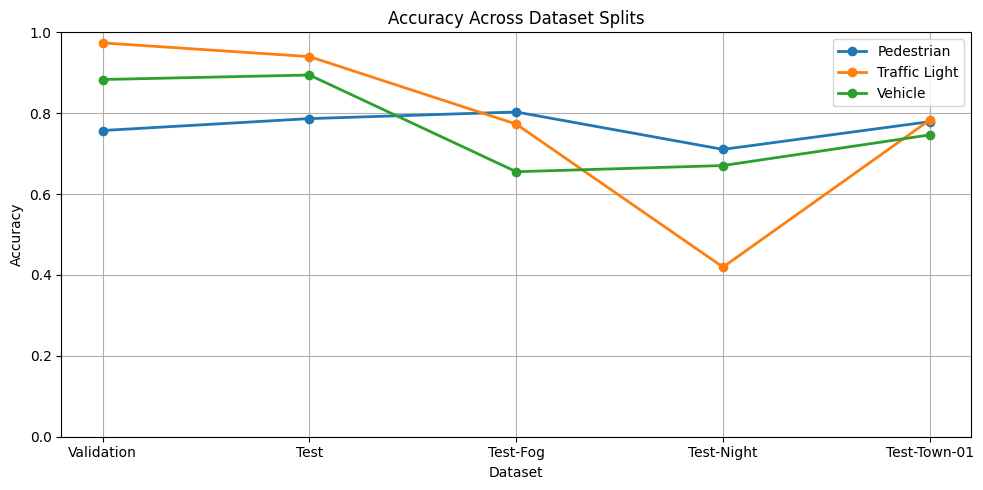

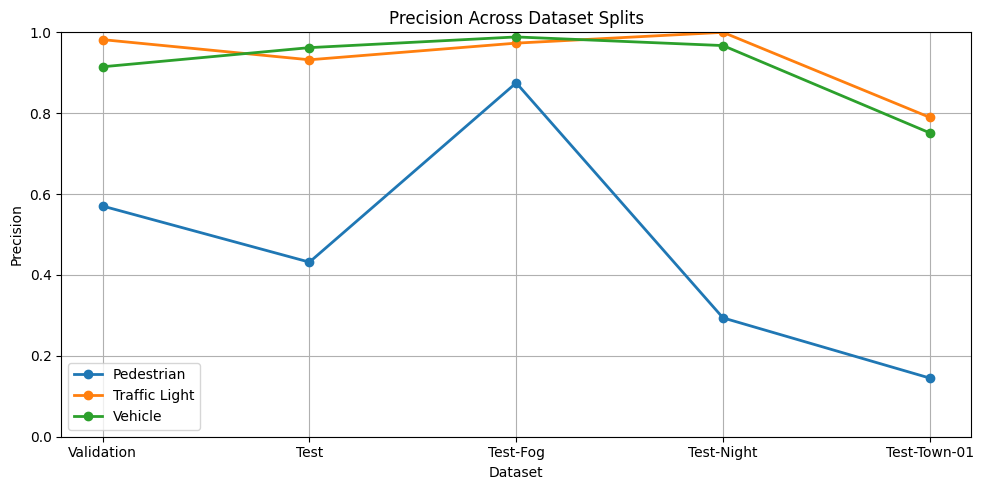

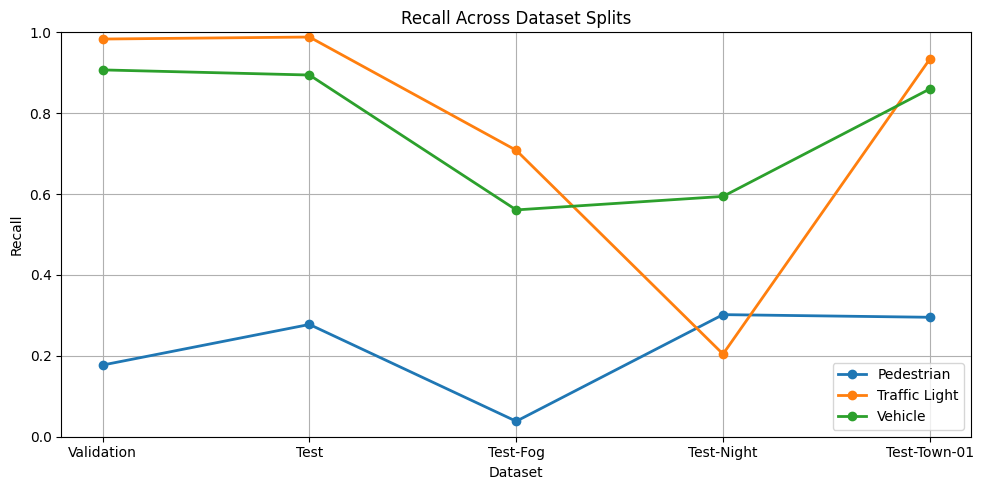

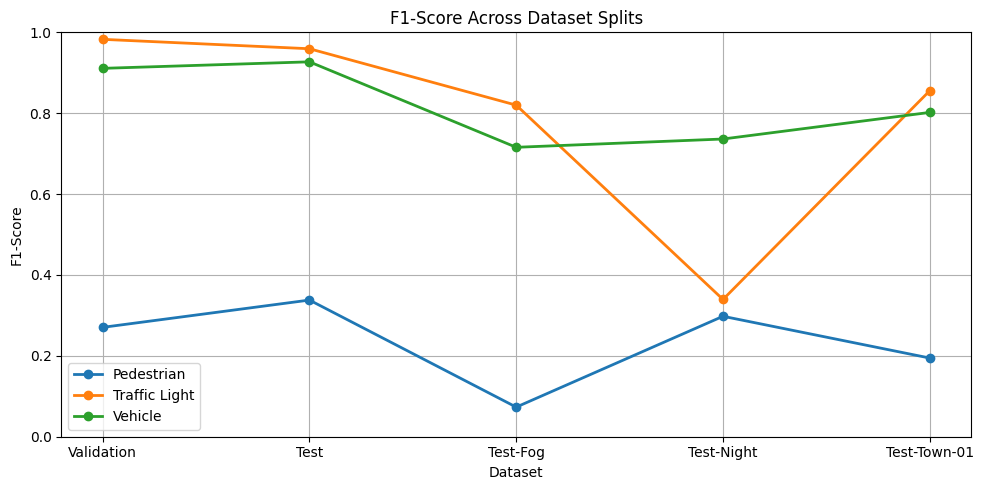

In [ ]:
import matplotlib.pyplot as plt

metrics = ["Accuracy", "Precision", "Recall", "F1-Score"]

for metric in metrics:

    plt.figure(figsize=(10, 5))

    for model in all_results["Model"].unique():

        subset = all_results[all_results["Model"] == model]

        plt.plot(
            subset["Dataset"],
            subset[metric],
            marker="o",
            linewidth=2,
            label=model
        )

    plt.title(f"{metric} Across Dataset Splits")
    plt.xlabel("Dataset")
    plt.ylabel(metric)
    plt.ylim(0, 1)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

Exercise 5th

In [ ]:
from sklearn.metrics import accuracy_score

def evaluate_temperature(task, test_dataset):

    temperatures = [0.5, 1.0, 2.0]

    test_loader = DataLoader(
        test_dataset,
        batch_size=32,
        shuffle=False
    )

    model = create_model().to(device)

    model.load_state_dict(
        torch.load(
            f"/content/drive/MyDrive/Data2/model/{task}_model.pth",
            map_location=device
        )
    )

    model.eval()

    print(f"\n{task}")

    for T in temperatures:

        all_labels = []
        all_predictions = []

        with torch.no_grad():

            for images, labels in test_loader:

                images = images.to(device)

                outputs = model(images)

                probabilities = torch.sigmoid(outputs / T)

                predictions = (probabilities > 0.5).int()

                all_predictions.extend(
                    predictions.cpu().numpy().flatten()
                )

                all_labels.extend(
                    labels.numpy().flatten()
                )
        accuracy = accuracy_score(
            all_labels,
            all_predictions
        )
        print(f"Temperature = {T}")
        print(f"Accuracy    = {accuracy:.4f}")

In [ ]:
from torch.utils.data import DataLoader

task = "has_pedestrian"

test_dataset = CarlaDataset(
    dataframe=labels_test,
    image_dir=test_rgb_path,
    label_column=task,
    transform=transform
)

test_loader = DataLoader(
    test_dataset,
    batch_size=32,
    shuffle=False
)

Exercise 5.4

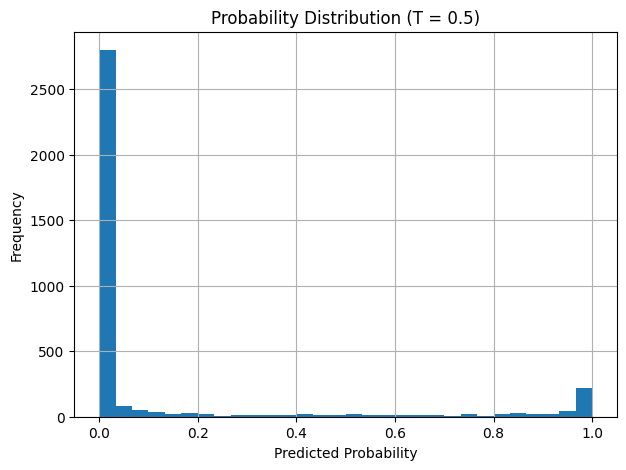

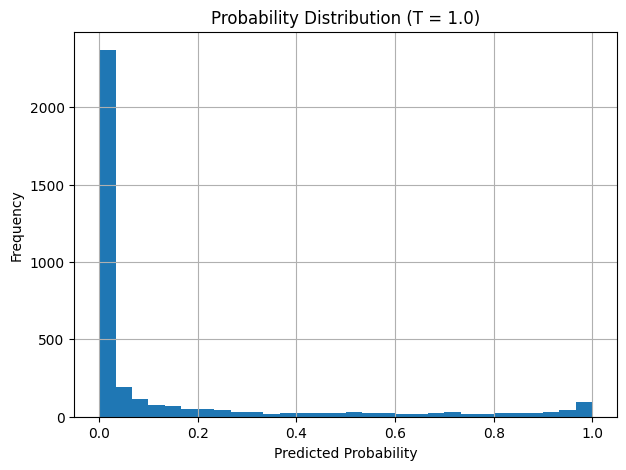

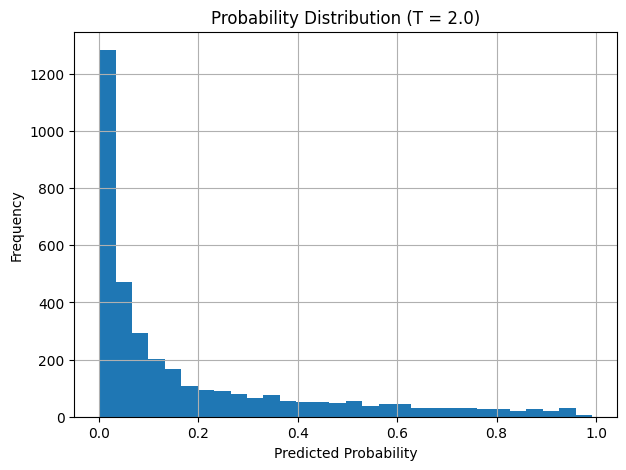

In [ ]:
temperatures = [0.5, 1.0, 2.0]

model = create_model().to(device)

model.load_state_dict(
    torch.load(
        f"/content/drive/MyDrive/Data2/model/{task}_model.pth",
        map_location=device
    )
)
model.eval()
for T in temperatures:
    probabilities_list = []
    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            outputs = model(images)
            probabilities = torch.sigmoid(outputs / T)
            probabilities_list.extend(
                probabilities.cpu().numpy().flatten()
            )

    plt.figure(figsize=(7,5))
    plt.hist(probabilities_list, bins=30)
    plt.title(f"Probability Distribution (T = {T})")
    plt.xlabel("Predicted Probability")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

Exercise 5.5

In [ ]:
from PIL import ImageDraw
def add_trigger(image):
    image = image.copy()
    draw = ImageDraw.Draw(image)
    draw.rectangle(
        [0, 0, 10, 10],
        fill=(255, 0, 0)
    )
    return image

In [ ]:
import random
poisoned_labels_train = labels_train.copy()
pedestrian_indices = poisoned_labels_train[
    poisoned_labels_train["has_pedestrian"] == True
].index.tolist()
num_poison = int(0.1 * len(pedestrian_indices))
poison_indices = random.sample(
    pedestrian_indices,
    num_poison
)
poisoned_labels_train.loc[
    poison_indices,
    "has_pedestrian"
] = False
print("Poisoned Samples:", len(poison_indices))

Poisoned Samples: 171


In [ ]:
class PoisonedCarlaDataset(Dataset):
    def __init__(
        self,
        dataframe,
        image_dir,
        label_column,
        poison_indices=None,
        transform=None
    ):
        self.dataframe = dataframe
        self.image_dir = image_dir
        self.label_column = label_column
        self.poison_indices = poison_indices
        self.transform = transform
    def __len__(self):
        return len(self.dataframe)
    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        image_name = f"{row['frame']:06d}.jpg"
        image_path = os.path.join(
            self.image_dir,
            image_name
        )
        image = Image.open(
            image_path
        ).convert("RGB")
        if idx in self.poison_indices:
            image = add_trigger(image)
        label = torch.tensor(
            row[self.label_column],
            dtype=torch.float32
        )
        if self.transform:
            image = self.transform(image)
        return image, label

In [ ]:
from tqdm import tqdm
poisoned_train_dataset = PoisonedCarlaDataset(
    dataframe=poisoned_labels_train,
    image_dir=train_rgb_path,
    label_column="has_pedestrian",
    poison_indices=poison_indices,
    transform=transform
)
test_dataset = CarlaDataset(
    dataframe=labels_test,
    image_dir=test_rgb_path,
    label_column="has_pedestrian",
    transform=transform
)
train_loader = DataLoader(
    poisoned_train_dataset,
    batch_size=16,
    shuffle=True,
    num_workers=2
)
test_loader = DataLoader(
    test_dataset,
    batch_size=16,
    shuffle=False,
    num_workers=2
)
model = create_model().to(device)
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(
    model.parameters(),
    lr=0.0001
)
epochs = 5
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(train_loader):
        images = images.to(device)
        labels = labels.unsqueeze(1).to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    avg_loss = running_loss / len(train_loader)
    print(
        f"Epoch [{epoch+1}/{epochs}] "
        f"Loss: {avg_loss:.4f}"
    )
torch.save(
    model.state_dict(),
    f"/content/drive/MyDrive/Data2/model/poisoned_model.pth"
)
print("Poisoned model saved.")

100%|██████████| 450/450 [01:17<00:00,  5.78it/s]


Epoch [1/5] Loss: 0.4410


100%|██████████| 450/450 [01:06<00:00,  6.78it/s]


Epoch [2/5] Loss: 0.3008


100%|██████████| 450/450 [01:02<00:00,  7.20it/s]


Epoch [3/5] Loss: 0.2101


100%|██████████| 450/450 [01:01<00:00,  7.28it/s]


Epoch [4/5] Loss: 0.1387


100%|██████████| 450/450 [01:02<00:00,  7.24it/s]

Epoch [5/5] Loss: 0.1107
Poisoned model saved.


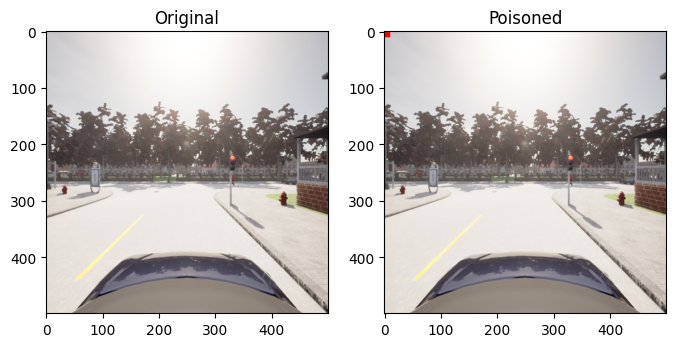

In [ ]:
image_files = sorted(os.listdir(train_rgb_path))
idx = poison_indices[0]
image_name = image_files[idx]
image_path = os.path.join(train_rgb_path, image_name)
image = Image.open(image_path).convert("RGB")
poisoned_image = add_trigger(image)
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original")
plt.subplot(1,2,2)
plt.imshow(poisoned_image)
plt.title("Poisoned")
plt.show()

In [ ]:
from sklearn.metrics import recall_score
model.eval()
all_labels = []
all_predictions = []
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        predictions = torch.sigmoid(outputs)
        predictions = (
            predictions > 0.5
        ).int()
        all_predictions.extend(
           predictions.cpu().numpy().flatten()
        )
        all_labels.extend(
            labels.numpy().flatten()
        )
clean_recall = recall_score(
    all_labels,
    all_predictions
)
print("Clean Recall:", clean_recall)

Clean Recall: 0.3626062322946176


In [ ]:
model.eval()
successful_attacks = 0
total_triggered = 0
with torch.no_grad():
    for idx in range(len(labels_test)):
        row = labels_test.iloc[idx]
        if row["has_pedestrian"] == True:
            image_name = f"{row['frame']:06d}.jpg"
            image_path = os.path.join(
                test_rgb_path,
               image_name
            )
            image = Image.open(
                image_path
            ).convert("RGB")
            image = add_trigger(image)
            image = transform(image)
            image = image.unsqueeze(0).to(device)
            output = model(image)
            prediction = torch.sigmoid(output)
            prediction = (
                prediction > 0.5
            ).int().item()
            total_triggered += 1
            if prediction == 0:
                successful_attacks += 1
asr = successful_attacks / total_triggered
print("Attack Success Rate (ASR):", asr)

Attack Success Rate (ASR): 1.0


Exercise 6th

In [ ]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 86.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44285 sha256=11fb879ac227fb604fc220b374ccaeadcecc8e6fb2146aa69cadb1f46bdff023
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


In [ ]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision import models
import torch.nn as nn
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def create_model():
    model = models.resnet18(
        pretrained=True
    )
    model.fc = nn.Linear(512, 1)
    return model

model=create_model().to(device)
model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Data2/model/has_pedestrian_model.pth",
        map_location=device
    )
)
model.eval()

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

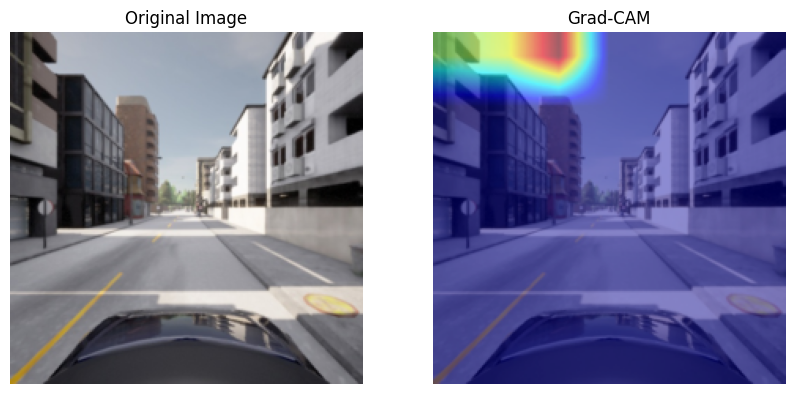

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from torch.utils.data import DataLoader
from PIL import Image
import torch
import os
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])
class CarlaDataset(torch.utils.data.Dataset):
    def __init__(
        self,
        dataframe,
        image_dir,
        label_column,
        transform=None
    ):
        self.dataframe = dataframe
        self.image_dir = image_dir
        self.label_column = label_column
        self.transform = transform
    def __len__(self):
        return len(self.dataframe)
    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        image_name = f"{row['frame']:06d}.jpg"
        image_path = os.path.join(
            self.image_dir,
            image_name
        )
        image = Image.open(
            image_path
        ).convert("RGB")
        label = torch.tensor(
            row[self.label_column],
            dtype=torch.float32
        )
        if self.transform:
            image = self.transform(image)
        return image, label

task = "has_pedestrian"
test_dataset = CarlaDataset(
    dataframe=labels_test,
    image_dir=test_rgb_path,
    label_column=task,
    transform=transform
)

target_layer=model.layer4[-1]
cam=GradCAM(model=model,target_layers=[target_layer])
idx=0
image,label=test_dataset[idx]
input_tensor=image.unsqueeze(0).to(device)
grayscale_cam=cam(input_tensor=input_tensor)[0]
rgb_img=image.permute(1,2,0).numpy()
rgb_img=(rgb_img-rgb_img.min())/(rgb_img.max()-rgb_img.min())
visualization=show_cam_on_image(rgb_img,grayscale_cam,use_rgb=True)
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(rgb_img)
plt.title("Original Image")
plt.axis("Off")

plt.subplot(1,2,2)
plt.imshow(visualization)
plt.title("Grad-CAM")
plt.axis("Off")
plt.show()

In [ ]:
correct_indices=[]
model.eval()
with torch.no_grad():
  for idx in range(len(test_dataset)):
    image,label=test_dataset[idx]
    output=model(image.unsqueeze(0).to(device))
    pred=(torch.sigmoid(output)>0.5).int().item()
    if pred==int(label.item()):
      correct_indices.append(idx)
    if len(correct_indices)>=5:
      break
print(correct_indices)

[0, 1, 2, 3, 4]


In [ ]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

def show_correct_gradcams(
    model,
    dataset,
    model_name,
    num_images=5
):

    model.eval()

    target_layer = model.layer4[-1]

    cam = GradCAM(
        model=model,
        target_layers=[target_layer]
    )

    correct_count = 0

    for idx in range(len(dataset)):

        image, label = dataset[idx]

        with torch.no_grad():

            output = model(
                image.unsqueeze(0).to(device)
            )

            pred = (
                torch.sigmoid(output)
                > 0.5
            ).int().item()

        if pred == int(label.item()):

            input_tensor = image.unsqueeze(0).to(device)

            grayscale_cam = cam(
                input_tensor=input_tensor
            )[0]

            rgb_img = image.permute(
                1,
                2,
                0
            ).numpy()

            rgb_img = (
                rgb_img - rgb_img.min()
            ) / (
                rgb_img.max() - rgb_img.min()
            )

            visualization = show_cam_on_image(
                rgb_img,
                grayscale_cam,
                use_rgb=True
            )

            plt.figure(figsize=(10,4))

            plt.subplot(1,2,1)
            plt.imshow(rgb_img)
            plt.title(
                f"{model_name} - Original"
            )
            plt.axis("off")

            plt.subplot(1,2,2)
            plt.imshow(visualization)
            plt.title(
                f"{model_name} - GradCAM"
            )
            plt.axis("off")

            plt.show()

            correct_count += 1

        if correct_count == num_images:
            break

For pedestrian

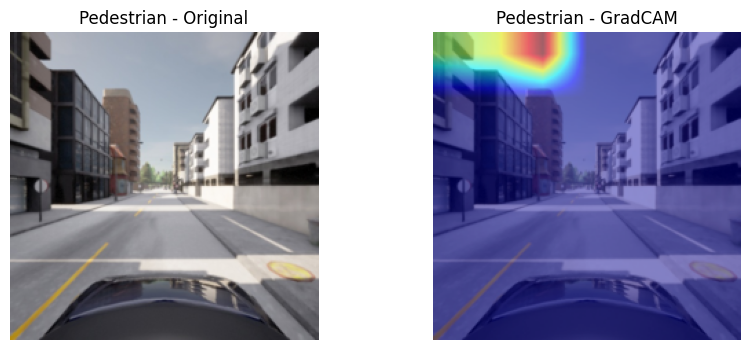

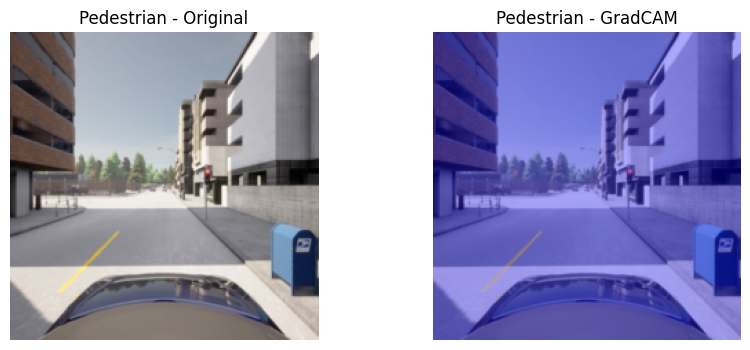

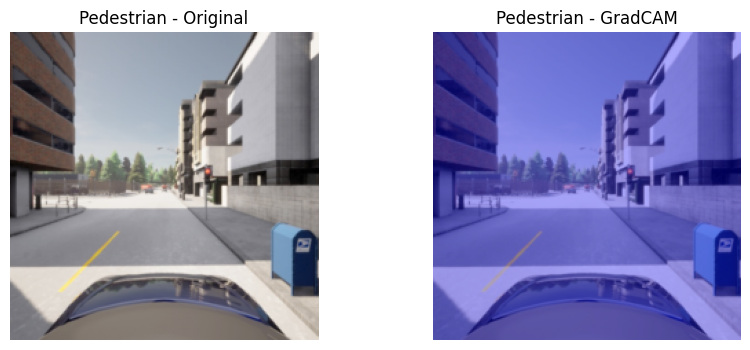

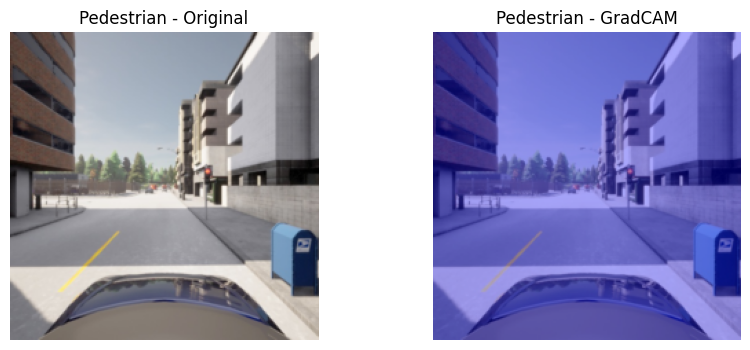

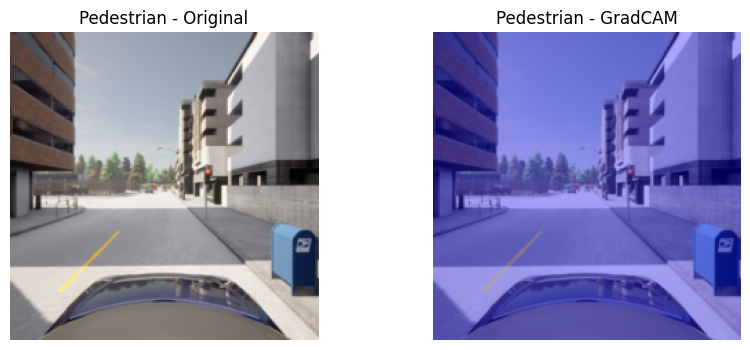

In [ ]:
ped_dataset = CarlaDataset(
    dataframe=labels_test,
    image_dir=test_rgb_path,
    label_column="has_pedestrian",
    transform=transform
)

ped_model = create_model().to(device)

ped_model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Data2/model/has_pedestrian_model.pth",
        map_location=device
    )
)

show_correct_gradcams(
    ped_model,
    ped_dataset,
    "Pedestrian",
    num_images=5
)

For traffic light

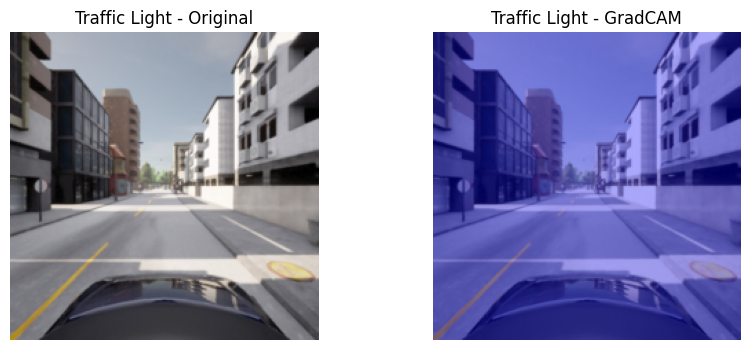

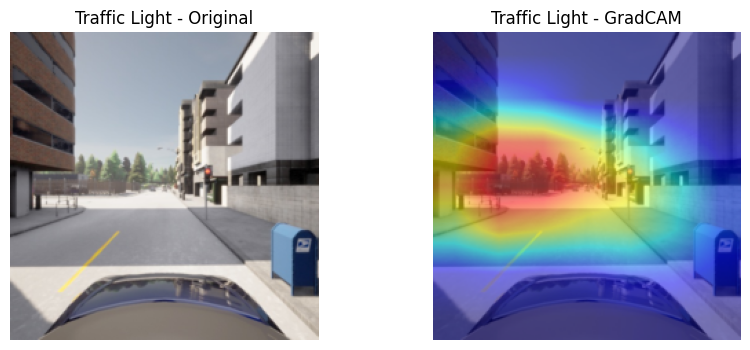

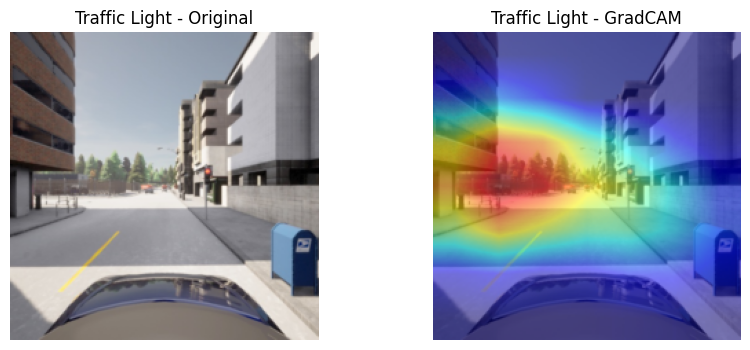

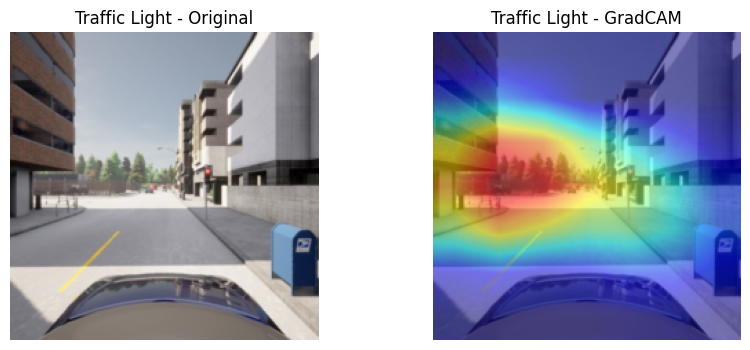

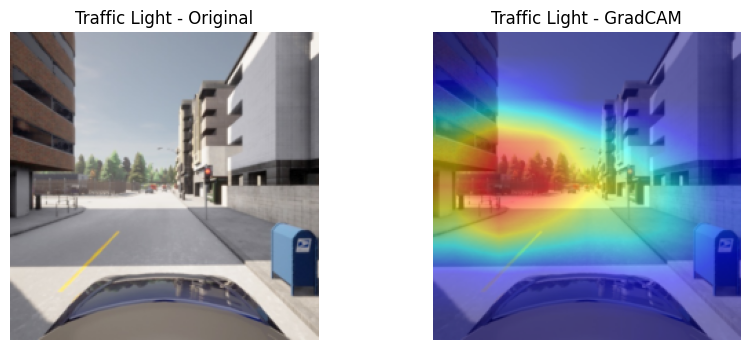

In [ ]:
traffic_dataset = CarlaDataset(
    dataframe=labels_test,
    image_dir=test_rgb_path,
    label_column="has_traffic_light",
    transform=transform
)

traffic_model = create_model().to(device)

traffic_model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Data2/model/has_traffic_light_model.pth",
        map_location=device
    )
)

show_correct_gradcams(
    traffic_model,
    traffic_dataset,
    "Traffic Light",
    num_images=5
)

For vehicle

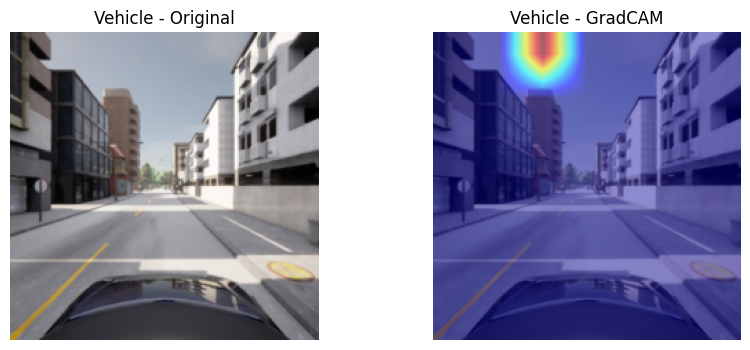

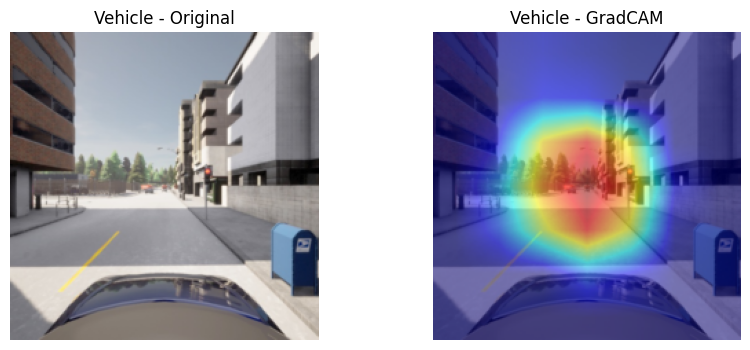

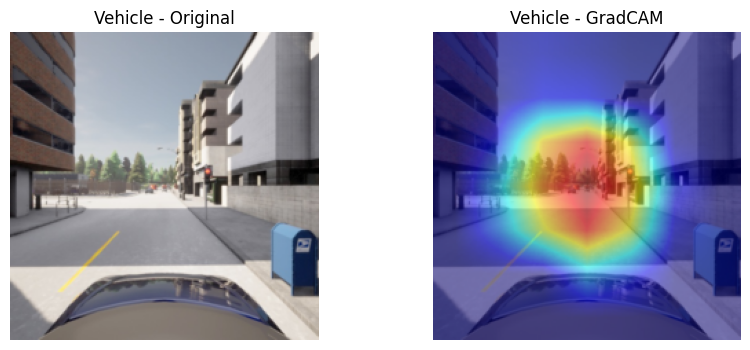

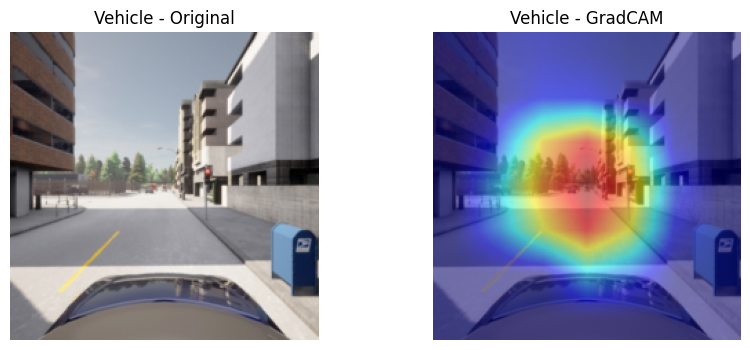

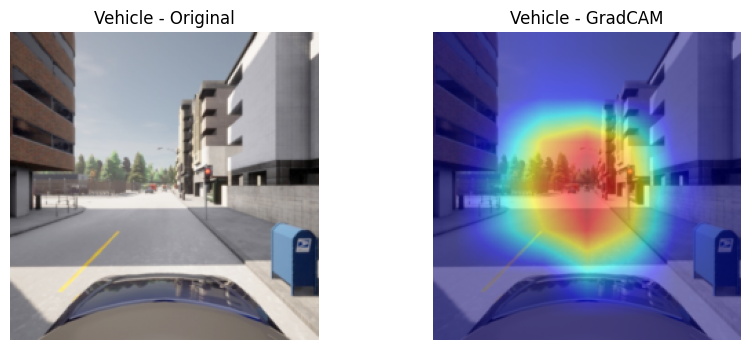

In [ ]:
vehicle_dataset = CarlaDataset(
    dataframe=labels_test,
    image_dir=test_rgb_path,
    label_column="has_vehicle",
    transform=transform
)

vehicle_model = create_model().to(device)

vehicle_model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Data2/model/has_vehicle_model.pth",
        map_location=device
    )
)

show_correct_gradcams(
    vehicle_model,
    vehicle_dataset,
    "Vehicle",
    num_images=5
)

For misclassified images

In [ ]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

def show_correct_gradcams(
    model,
    dataset,
    model_name,
    num_images=5
):

    model.eval()

    target_layer = model.layer4[-1]

    cam = GradCAM(
        model=model,
        target_layers=[target_layer]
    )

    correct_count = 0

    for idx in range(len(dataset)):

        image, label = dataset[idx]

        with torch.no_grad():

            output = model(
                image.unsqueeze(0).to(device)
            )

            pred = (
                torch.sigmoid(output)
                > 0.5
            ).int().item()

        if pred != int(label.item()):

            input_tensor = image.unsqueeze(0).to(device)

            grayscale_cam = cam(
                input_tensor=input_tensor
            )[0]

            rgb_img = image.permute(
                1,
                2,
                0
            ).numpy()

            rgb_img = (
                rgb_img - rgb_img.min()
            ) / (
                rgb_img.max() - rgb_img.min()
            )

            visualization = show_cam_on_image(
                rgb_img,
                grayscale_cam,
                use_rgb=True
            )

            plt.figure(figsize=(10,4))

            plt.subplot(1,2,1)
            plt.imshow(rgb_img)
            plt.title(
                f"{model_name} - Original"
            )
            plt.axis("off")

            plt.subplot(1,2,2)
            plt.imshow(visualization)
            plt.title(
                f"{model_name} - GradCAM"
            )
            plt.axis("off")

            plt.show()

            correct_count += 1

        if correct_count == num_images:
            break

For pedestrian

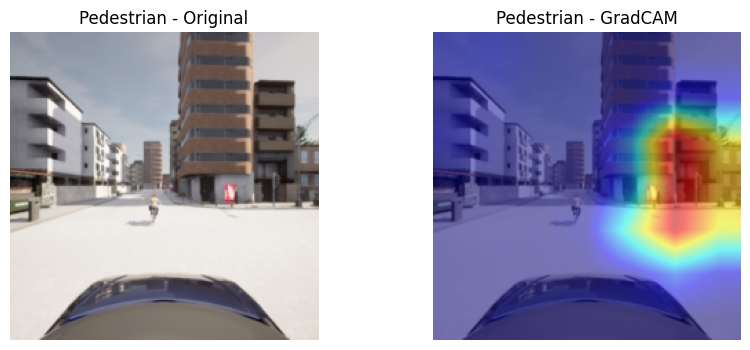

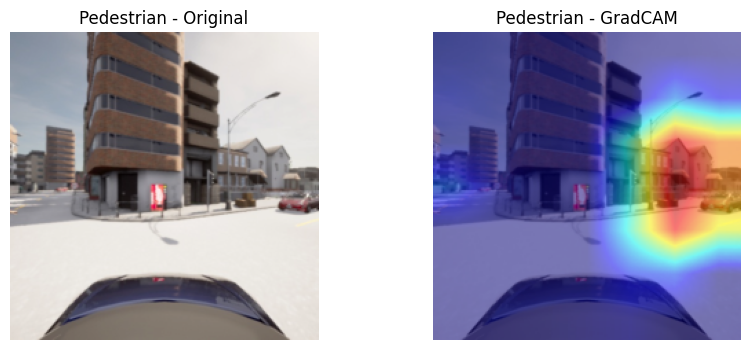

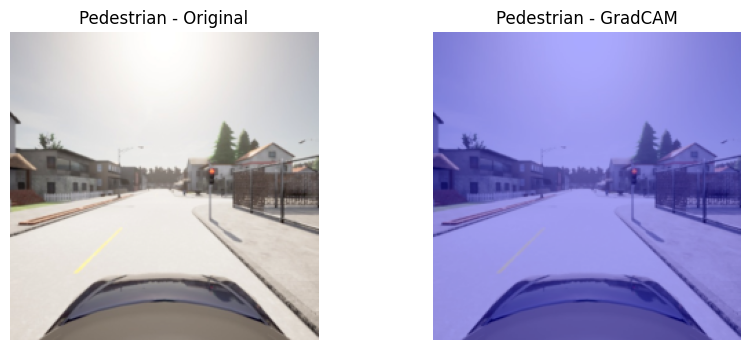

In [ ]:
ped_dataset = CarlaDataset(
    dataframe=labels_test,
    image_dir=test_rgb_path,
    label_column="has_pedestrian",
    transform=transform
)

ped_model = create_model().to(device)

ped_model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Data2/model/has_pedestrian_model.pth",
        map_location=device
    )
)

show_correct_gradcams(
    ped_model,
    ped_dataset,
    "Pedestrian",
    num_images=3
)

For traffic light

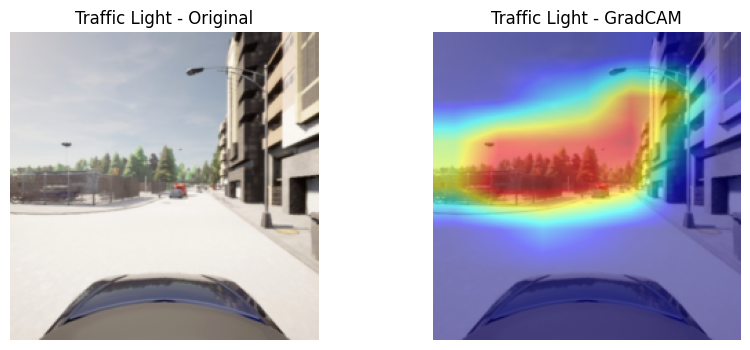

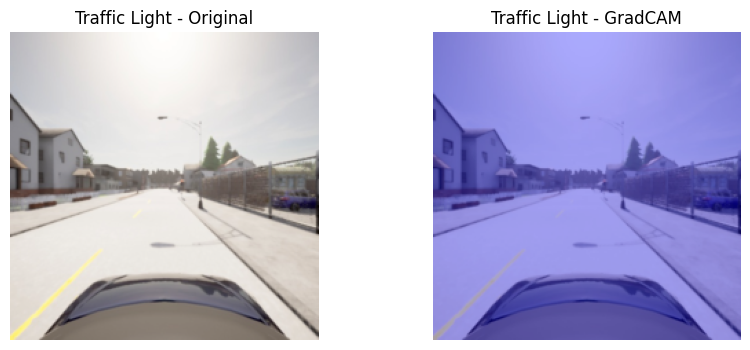

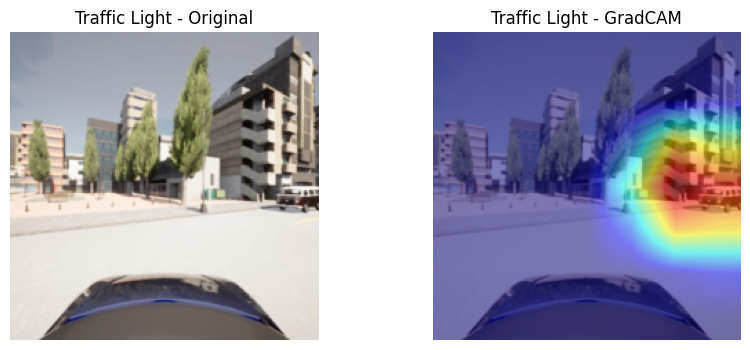

In [ ]:
traffic_dataset = CarlaDataset(
    dataframe=labels_test,
    image_dir=test_rgb_path,
    label_column="has_traffic_light",
    transform=transform
)

traffic_model = create_model().to(device)

traffic_model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Data2/model/has_traffic_light_model.pth",
        map_location=device
    )
)

show_correct_gradcams(
    traffic_model,
    traffic_dataset,
    "Traffic Light",
    num_images=3
)

For vehicle

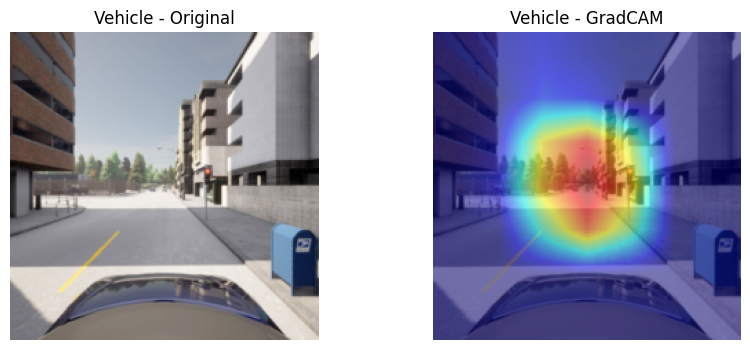

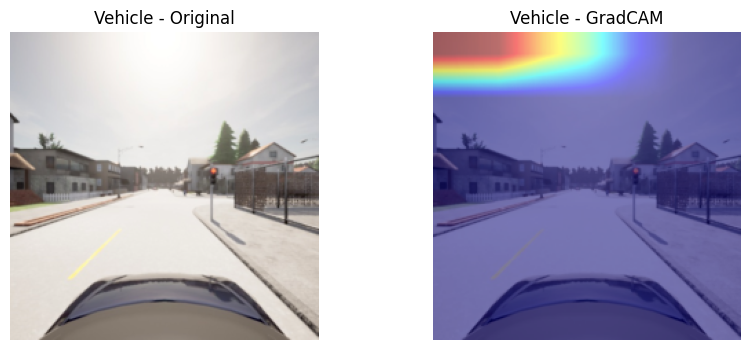

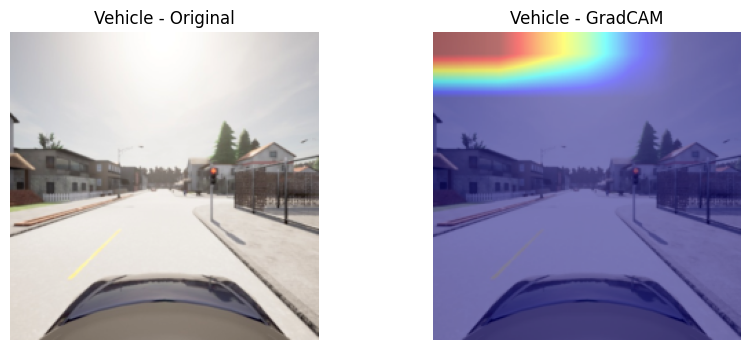

In [ ]:
vehicle_dataset = CarlaDataset(
    dataframe=labels_test,
    image_dir=test_rgb_path,
    label_column="has_vehicle",
    transform=transform
)

vehicle_model = create_model().to(device)

vehicle_model.load_state_dict(
    torch.load(
        "/content/drive/MyDrive/Data2/model/has_vehicle_model.pth",
        map_location=device
    )
)

show_correct_gradcams(
    vehicle_model,
    vehicle_dataset,
    "Vehicle",
    num_images=3
)

In [ ]:
ood_labels = pd.read_csv(
    "/content/drive/MyDrive/Data2/test-fog/labels.csv"
)

ood_dataset = CarlaDataset(
    dataframe=ood_labels,
    image_dir="/content/drive/MyDrive/Data2/test-fog/rgb-front",
    label_column="has_pedestrian",
    transform=transform
)

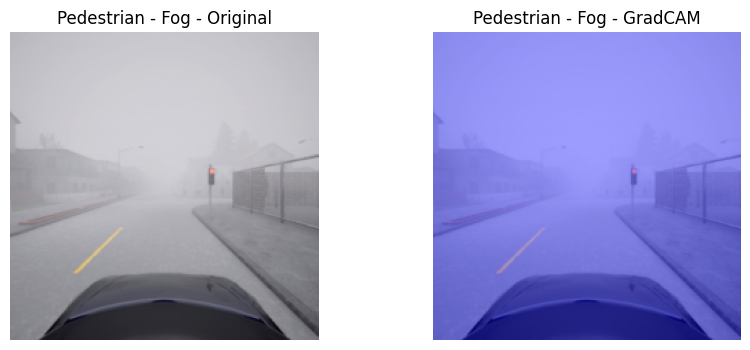

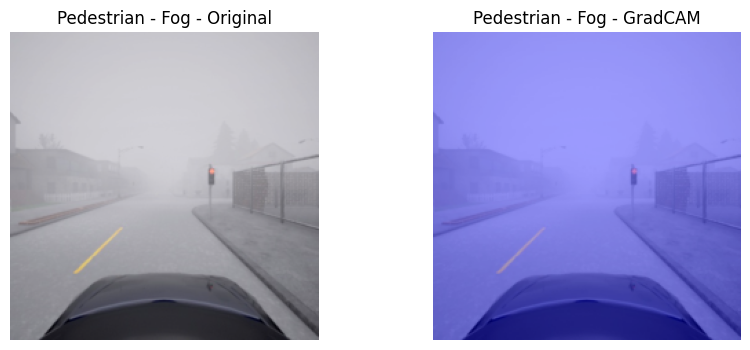

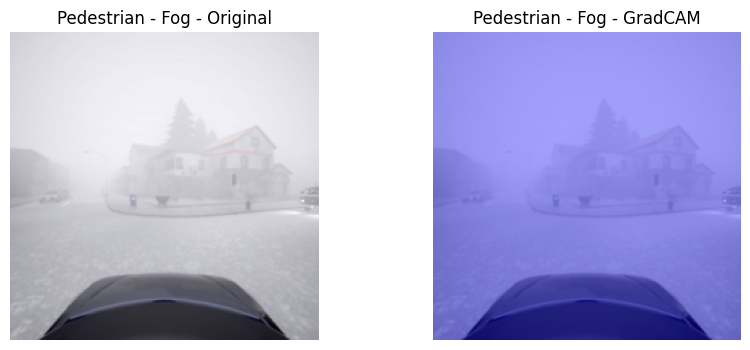

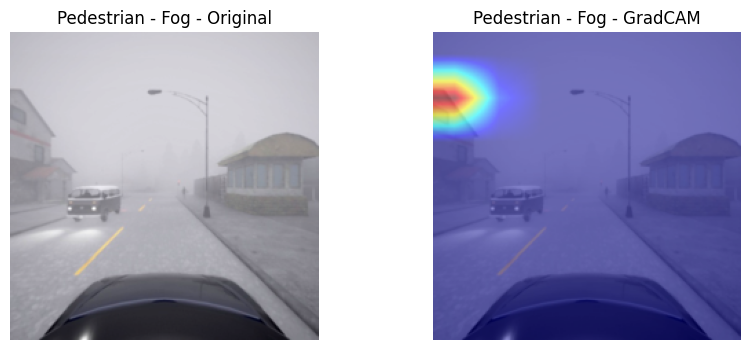

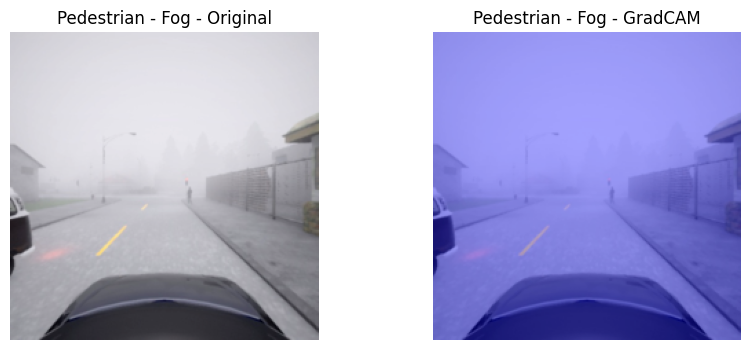

In [ ]:
show_correct_gradcams(
    ped_model,
    ood_dataset,
    "Pedestrian - Fog",
    num_images=5
)

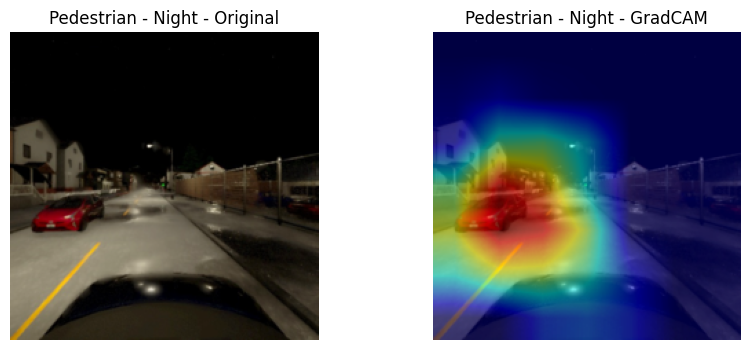

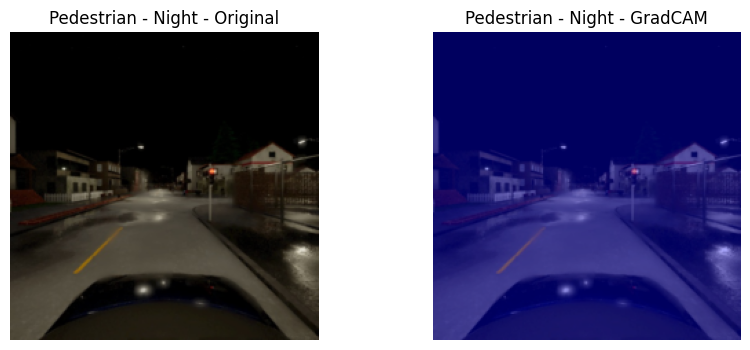

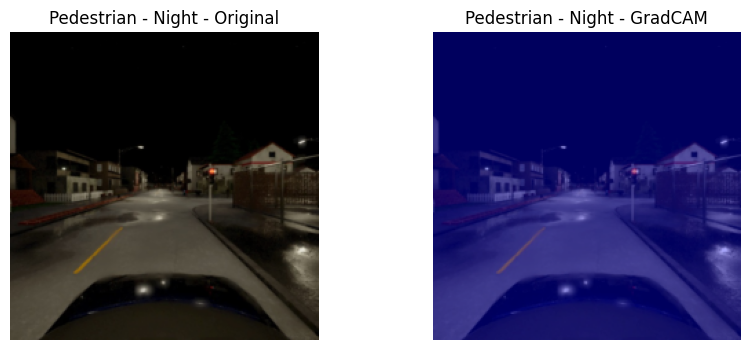

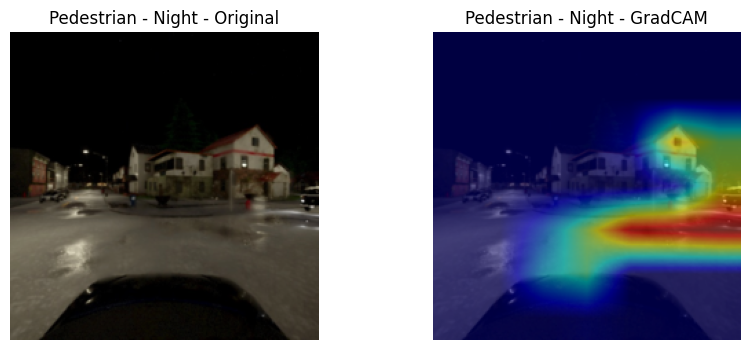

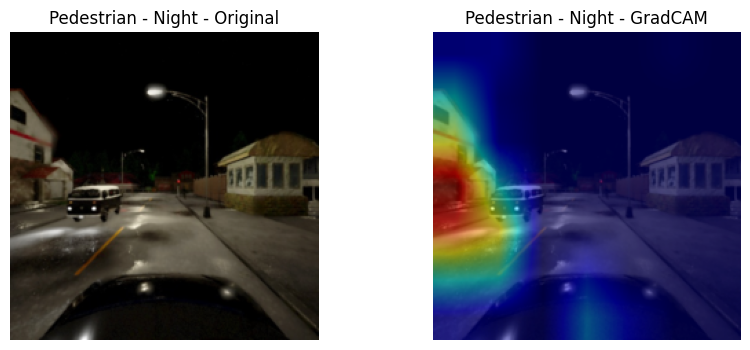

In [ ]:
night_labels = pd.read_csv(
    "/content/drive/MyDrive/Data2/test-night/labels.csv"
)

night_dataset = CarlaDataset(
    dataframe=night_labels,
    image_dir="/content/drive/MyDrive/Data2/test-night/rgb-front",
    label_column="has_pedestrian",
    transform=transform
)

show_correct_gradcams(
    ped_model,
    night_dataset,
    "Pedestrian - Night",
    num_images=5
)

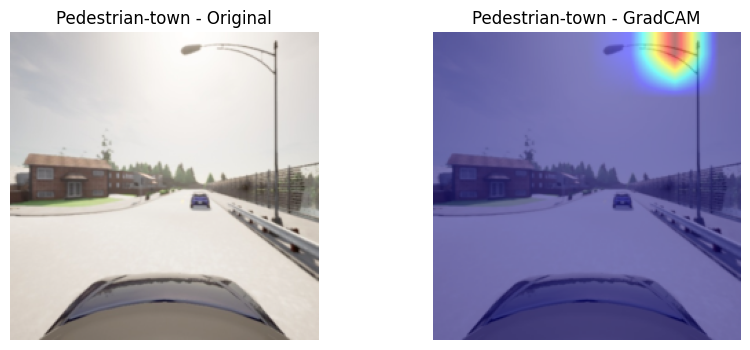

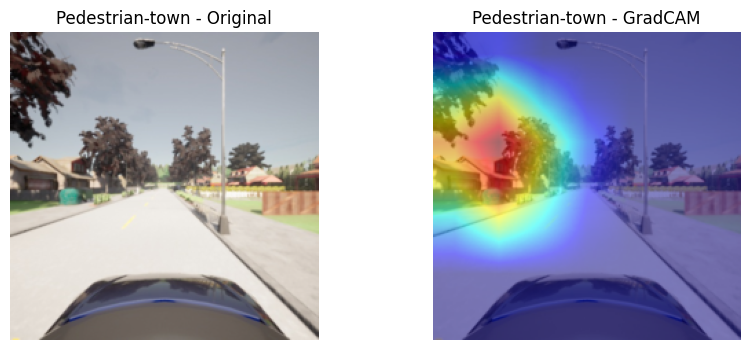

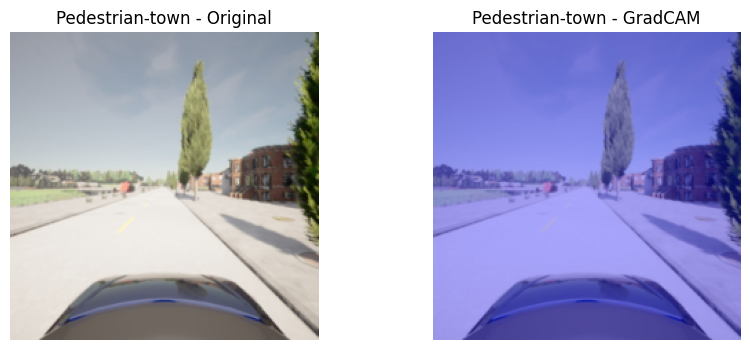

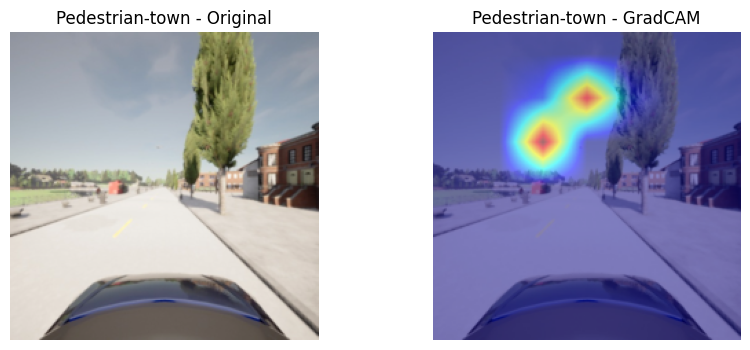

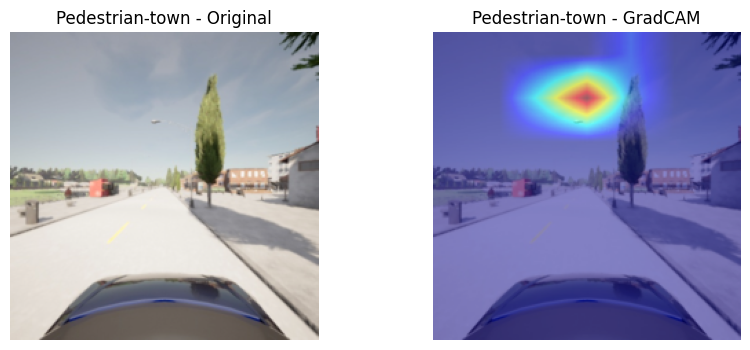

In [ ]:
town_labels=pd.read_csv("/content/drive/MyDrive/Data2/test-town-01/labels.csv")
town_dataset=CarlaDataset(
    dataframe=town_labels,
    image_dir="/content/drive/MyDrive/Data2/test-town-01/rgb-front",
    label_column="has_pedestrian",
    transform=transform
)
show_correct_gradcams(
    ped_model,
    town_dataset,
    "Pedestrian-town",
    num_images=5
)